<a href="https://colab.research.google.com/github/StavroK/Articles/blob/main/20220905_Source_correlation_between_GDP_and_life_expectancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Has our health improved as result of economic growth and globalization?


**We still have very large inequalities across with in countries, but no country in the world has a lower life expectancy than the countries with the highest life expectancy in pre-industrial world. Many countries that not long ago were suffering from bad health are catching up rapidly. **

This article is working on the assumption that life expectancy at birth through the years is a good metric of population health. Life expectancy captures mortality all trough life, including birth and early years. It also tell us about the average age of death in a population. 

According to Max Roser, Esteban Ortiz-Ospina and Hannah Ritchie (2013) - "Life Expectancy". Published online at OurWorldInData.org it is estimated that in pre-industrial world life expectancy in average was between 30 years to 40 years. In countries that were early adoptors of industry, life expectancy started to rise, while others experienced same. 

Before industrialization, the way society produced its sustainment had not changed much since middle ages. We realied on family units, using animal and labor to produce limited to human productivity. At some level, work could be powered by windmills and waterwhells but our ability to reserve its power made it unrelable.

Industrialization began in Britain late 18th century, when James Watt's patent ran out. Up to this point the steam engine was used to pump water out of coal mines. During 19th century steam locomotives and stream engines appeared in Britain revolutionazing travel. By the middle of that century manufacturing had already gone through the same transformation in Britain and kept as a high regarded secret. Although versions of steam engine appered in China and Turkey during Watt's time; it was Britain´s limited goverment involvement and system of free enterprise that made it possible to move faster in technology development.

Other countries that followed Britain's development of factories and railroads as some of Britain's enterprenurs emigrated where United States, Belgium, Switzerland, France, and the states that became Germany.

In this exercise we will also use Gross Domestic Product ( GDP ), as a measure of industry (productivity, output). Using current prices, it measures the value of goods and services for final comsumption, private and public, present and investment of goods. We could argue that rising GDP per capita follows people's desires and preferences. For a case on GDP as a measure of wealth and well-being appreciation, the author has used Oulton, Nicolas "Hooray for GDP!" article CentrePiece magazine, Winter 2012 (Centre for Economic Performance, LSE).

# Life Expectancy at Birth by Country through the years

Showing life expectancy at birth by country in years. Using the latest data for UN Department of Ecnomic and Social Affairs, World Population prospects 2022: Life Expectancy at Birth, both sexes (years).

We start by preparing data for visualization and analysis on Life Expectancy at Birth, both sexes (years)

In [ ]:
# Making sure all python libraries necessary are updated
#!pip install --upgrade pandas
!pip install --upgrade xlrd
#!pip install --upgrade numpy
#!pip install --upgrade seaborn
#!pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 96 kB 4.7 MB/s 
  Attempting uninstall: xlrd
    Found existing installation: xlrd 1.1.0
    Uninstalling xlrd-1.1.0:
      Successfully uninstalled xlrd-1.1.0


In [ ]:
# Import neccesary python libraries for data extraction
# data extraction, loading, and transforming to make ready
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sp
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Import Excel Sheet, skipping first 15 rows of headding data, 
# explicitly assign first row as column header and assign first column as index
filename = '/content/drive/MyDrive/Codeacademy/Portfolio Project/WPP2022_GEN_F01_DEMOGRAPHIC_INDICATORS_COMPACT_REV1.xlsx'
sheetname = 'Estimates'
data_demos = pd.read_excel (filename, sheet_name= sheetname,skiprows=15,header=1,index_col=0) 

In [ ]:
# Imported data converted to a pandas DataFrame
# Reset Index to start at zero, from skipped rows.
# Reset drop to True so a new index column is not created, and keep initial index
df_demos = pd.DataFrame(data_demos).reset_index(drop=True)
# we print columns as a list to check if we want to rename some
# this is useful to also check if we do not have more than one index column
columns_demos = df_demos.columns.tolist()
for each in columns_demos: print(each)

Variant
Region, subregion, country or area *
Notes
Location code
ISO3 Alpha-code
ISO2 Alpha-code
SDMX code**
Type
Parent code
Year
Total Population, as of 1 January (thousands)
Total Population, as of 1 July (thousands)
Male Population, as of 1 July (thousands)
Female Population, as of 1 July (thousands)
Population Density, as of 1 July (persons per square km)
Population Sex Ratio, as of 1 July (males per 100 females)
Median Age, as of 1 July (years)
Natural Change, Births minus Deaths (thousands)
Rate of Natural Change (per 1,000 population)
Population Change (thousands)
Population Growth Rate (percentage)
Population Annual Doubling Time (years)
Births (thousands)
Births by women aged 15 to 19 (thousands)
Crude Birth Rate (births per 1,000 population)
Total Fertility Rate (live births per woman)
Net Reproduction Rate (surviving daughters per woman)
Mean Age Childbearing (years)
Sex Ratio at Birth (males per 100 female births)
Total Deaths (thousands)
Male Deaths (thousands)
Female Dea

In [ ]:
# Changing the names of columns for Country and LEAB
# need to use inplace = True parameter to keep (not only for step) changes at this dataframe
df_demos.rename(columns={'Region, subregion, country or area *':'Country','Life Expectancy at Birth, both sexes (years)':'LEAB','Total Population, as of 1 July (thousands)':'Population','Population Growth Rate (percentage)':'APGR'}, inplace = True)
# Here we are get only rows of country level data, 
# from column Type to avoid summarised data that is included on source data.
df_demos = df_demos[(df_demos.Type == 'Country/Area')]
# checking again to drop any new columns of index might be created.
df_demos.reset_index(drop=True)
# for this analysis we are only needing data of Country, Year, and Life Expectancy
df_demos = df_demos[['Location code','SDMX code**','ISO3 Alpha-code','Country','Parent code','Year','LEAB','Population','APGR']]
# By using pd.Series(df.column, dtype="type"), and not just df.column.astype('type')
# we are securing the change, sometimes .astype() does not work on changing objects to strings
df_demos['Country'] = pd.Series(df_demos['Country'], dtype="string")
df_demos['Year'] = pd.Series(df_demos['Year'], dtype="int64")
df_demos['SDMX code**'] = pd.Series(df_demos['SDMX code**'], dtype="int64")
df_demos['ISO3 Alpha-code'] = pd.Series(df_demos['ISO3 Alpha-code'], dtype="string")
df_demos['Parent code'] = pd.Series(df_demos['Parent code'], dtype="int64")
df_demos['Population'] = pd.Series(df_demos['Population'], dtype="float64")*1000
df_demos['APGR'] = pd.Series(df_demos['APGR'], dtype="float64")

print(df_demos.head())

      Location code  SDMX code** ISO3 Alpha-code  Country  Parent code  Year  \
1732            108          108             BDI  Burundi          910  1950   
1733            108          108             BDI  Burundi          910  1951   
1734            108          108             BDI  Burundi          910  1952   
1735            108          108             BDI  Burundi          910  1953   
1736            108          108             BDI  Burundi          910  1954   

        LEAB  Population   APGR  
1732  40.579   2254113.0  2.200  
1733  40.812   2303248.0  2.114  
1734  41.003   2351535.0  2.036  
1735  41.282   2399099.0  1.969  
1736  41.558   2446758.0  1.965  


In [ ]:
print(df_demos.describe(include='all'))
print(df_demos.info())
# need to look at data types for Year, Country and Life Expentancy
# need to look at Life Expentancy as top value is "...", and drop rows with no numerical data

        Location code   SDMX code** ISO3 Alpha-code  Country   Parent code  \
count    17064.000000  17064.000000           17064    17064  17064.000000   
unique            NaN           NaN             237      237           NaN   
top               NaN           NaN             BDI  Burundi           NaN   
freq              NaN           NaN              72       72           NaN   
mean       440.282700    440.282700             NaN      NaN   1191.459916   
std        251.624389    251.624389             NaN      NaN   1079.800757   
min          4.000000      4.000000             NaN      NaN    905.000000   
25%        226.000000    226.000000             NaN      NaN    914.000000   
50%        440.000000    440.000000             NaN      NaN    922.000000   
75%        659.000000    659.000000             NaN      NaN    926.000000   
max        894.000000    894.000000             NaN      NaN   5501.000000   

                Year   LEAB    Population          APGR  
count

In [ ]:
# We are dropping rows by their index, where values in LEAB are not numerical
# inplace = True parameter used to keep changes (not just this step)
df_demos.drop(df_demos[pd.to_numeric(df_demos['LEAB'], errors='coerce').isnull()].index, inplace = True)
df_demos['LEAB'] = pd.Series(df_demos['LEAB'], dtype="float64")
#df_demos = df_demos.sort_values('LEAB', ascending = True, inplace=True)
# By printing .info() and .describe() we are checking that data types, number of rows, and
# that numeric variables produce distribution statistics and non-numeric variables produce
# frequency statistics
print(df_demos.head())
print(df_demos.info())
print(df_demos.describe(include='all'))

      Location code  SDMX code** ISO3 Alpha-code  Country  Parent code  Year  \
1732            108          108             BDI  Burundi          910  1950   
1733            108          108             BDI  Burundi          910  1951   
1734            108          108             BDI  Burundi          910  1952   
1735            108          108             BDI  Burundi          910  1953   
1736            108          108             BDI  Burundi          910  1954   

        LEAB  Population   APGR  
1732  40.579   2254113.0  2.200  
1733  40.812   2303248.0  2.114  
1734  41.003   2351535.0  2.036  
1735  41.282   2399099.0  1.969  
1736  41.558   2446758.0  1.965  
<class 'pandas.core.frame.DataFrame'>
Int64Index: 16992 entries, 1732 to 20595
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Location code    16992 non-null  int64  
 1   SDMX code**      16992 non-null  int64  
 2   ISO3 Alpha-code

Now data is ready for visualization data is available from 1950 to 2021. I have selected a Ridge plot to show life expectency at birth (in years) distribution by Country which is an average value from population in a given year. The reason of chosing is that we are countries have different starting points both in year of register and ranges of life expectancies we are seeing at LEAB spread: 25% to 75% difference is aproximate to 20 years from 55 years to 72 years, but we see a minimum value of 12 LEAB years and maximum value of 87 LEAB years. Ridge Plot allows not only to see mean/median and interquartile ranges as in bloxplots, and vizualize density distribution of data ( spread of data ) as with Violin Plots, but it also allows us to work with the 236 countries in the file.

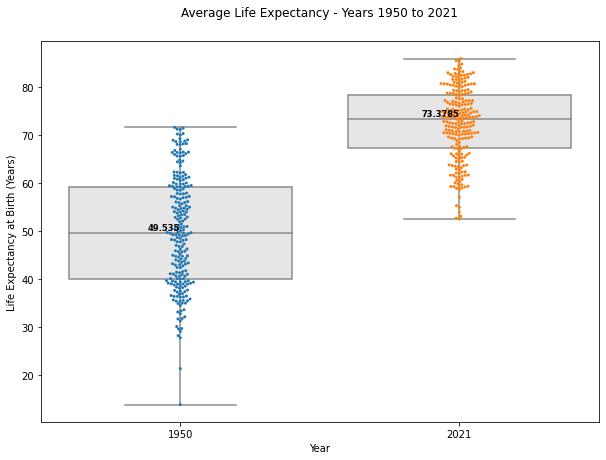

<Figure size 432x288 with 0 Axes>

In [ ]:
df_1950_2021 = df_demos.loc[(df_demos['Year'] == 1950)|(df_demos['Year'] == 2021)].sort_values(by=['LEAB','Country'],ascending=False)
df_1950_2021['LEAB'] = df_1950_2021[['LEAB']].dropna()
fig = plt.figure(figsize =(10, 7))
bp =sns.boxplot(x='Year', y='LEAB', data=df_1950_2021,meanline=True, color=".9")
sns.swarmplot(data=df_1950_2021, x="Year", y="LEAB", size=3)
medians = list(df_1950_2021.groupby(['Year'])['LEAB'].median())
vertical_offset = df_1950_2021['LEAB'].median()*.01

for xtick in bp.get_xticks():
    bp.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='right',size='small',color='black',weight='semibold')
plt.ylabel('Life Expectancy at Birth (Years)')
plt.title ('Average Life Expectancy - Years 1950 to 2021', pad=25)
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_1950_2021.png', dpi=100)
plt.clf()

In [ ]:
prep_order = df_demos.groupby('Country')['LEAB'].max().sort_values(ascending=False).reset_index(level='Country')
my_order = list(prep_order['Country'])
countries_label = pd.Series(prep_order['Country'])
countries_ticks = pd.Series(x for x in range(len(countries_label)))
base_LEAB =[30,40]
quantiles = np.quantile(df_demos['LEAB'], np.array([0, 0.25, 0.50, 0.75, 1]))
print(quantiles)
quantiles_labels = list(pd.Series(np.round(x,2) for x in quantiles))

[11.995  55.634  66.2745 72.6735 86.542 ]


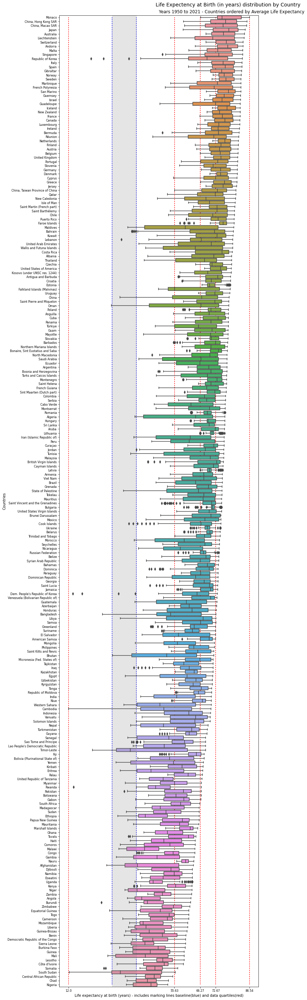

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,50))
ax= sns.boxplot(x='LEAB', y='Country',data=df_demos, orient="h", order=my_order)
plt.ylabel("Countries")
plt.xlabel("Life expectancy at birth (years) - includes marking lines baseline(blue) and data quartiles(red)")
ax.set_yticks(countries_ticks)
ax.set_yticklabels(countries_label, fontsize=8)
ax.vlines(quantiles, 0, 235, color='r', ls=':', lw=2, zorder=0 )
ax.set_xticks(quantiles_labels)
ax.set_xticklabels(quantiles_labels, fontsize=8)
plt.suptitle('Life Expectency at Birth (in years) distribution by Country',fontsize=14,y=.89,horizontalalignment='left')
plt.title('Years 1950 to 2021 - Countries ordered by Average Life Expectancy',fontsize=12,horizontalalignment='left')
ax.vlines([30,40], 0, 235, color='blue', ls=':', lw=2, zorder=0 )
ax.axvspan(30,40, alpha=0.2, color='gray')
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_COUNTRY_BOX.png', dpi=100)
plt.clf()


Interpretation

Les look at GDP Data

In [ ]:
# Import Excel Sheet, skipping first 2 rows of headding data, 
# explicitly assign first row as column header and assign first column as index
filename = '/content/drive/MyDrive/Codeacademy/Portfolio Project/API_NY.GDP.MKTP.CD_DS2_en_excel_v2_4473553.xls'
sheetname = 'Data'
data_GDP = pd.read_excel (filename, sheet_name= sheetname,skiprows=2,header=1,index_col=0) 
print(data_GDP.head())

                            Country Code     Indicator Name  Indicator Code  \
Country Name                                                                  
Aruba                                ABW  GDP (current US$)  NY.GDP.MKTP.CD   
Africa Eastern and Southern          AFE  GDP (current US$)  NY.GDP.MKTP.CD   
Afghanistan                          AFG  GDP (current US$)  NY.GDP.MKTP.CD   
Africa Western and Central           AFW  GDP (current US$)  NY.GDP.MKTP.CD   
Angola                               AGO  GDP (current US$)  NY.GDP.MKTP.CD   

                                     1960          1961          1962  \
Country Name                                                            
Aruba                                 NaN           NaN           NaN   
Africa Eastern and Southern  2.129059e+10  2.180847e+10  2.370702e+10   
Afghanistan                  5.377778e+08  5.488889e+08  5.466667e+08   
Africa Western and Central   1.040414e+10  1.112789e+10  1.194319e+10   
Angola  

In [ ]:
# Imported data converted to a pandas DataFrame
# Reset Index to start at zero, from skipped rows.
# Reset drop to True so a new index column is not created, and keep initial index
df_GDP = pd.DataFrame(data_GDP).reset_index(drop=True)
# we print columns as a list to check if we want to rename some
# this is useful to also check if we do not have more than one index column
columns_GDP = df_GDP.columns.tolist()
print(columns_GDP)

['Country Code', 'Indicator Name', 'Indicator Code', '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']


In [ ]:
# after printing GDP first 5 rows we are seeing the need to transpose Years data to prepare
# for analysis of a proper tabular form. We will accomplish this by using the .melt() function.
data_GDP = data_GDP.melt(columns_GDP[0:3], var_name='Year', value_name='GDP')
# columns_GDP[0:3] is used to set dataFrame identifiers, and treat other columns as values
# later on we will use data_GDP['Country Code'] to relate to data we have on Life Expectancy for 
# df_demos['ISO3 Alpha-code']

Now that we have fully imported GDP information from  the World Back at https://data.worldbank.org/ we proceed. We start by preparing data for visualization and analysis on GDP by year the same as we did for Life Expectancy. This will get us to vizualize GDP density / distributions and draw some insights.

In [ ]:
# first we will select columns necesary such as Country, Year and GDP
df_GDP = data_GDP[['Country Code','Year','GDP']]
# we will look at data types and data description to align data
print(df_GDP.info())
# so from info() we see "Country Code" and "Year" as an object which might ginch
# that we have some other type of data included there. We want "Country Code" to 
# be a "string" and Year to be "int64"
# also we see that "GDP" is having far less rows with data, this could tell us that
# for some "Year" we do not have values in all "Country Codes".

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16492 entries, 0 to 16491
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Code  16492 non-null  object 
 1   Year          16492 non-null  object 
 2   GDP           13118 non-null  float64
dtypes: float64(1), object(2)
memory usage: 386.7+ KB
None


In [ ]:
# first lets us drop all rows that do not have data for GDP.
# inplace = True parameter used to keep changes (not just this step)
df_GDP.drop(df_GDP[pd.to_numeric(df_GDP['GDP'], errors='coerce').isnull()].index, inplace = True)
# see results using .info() function, so all columns have the same non-null count
print(df_GDP.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13118 entries, 1 to 16491
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Code  13118 non-null  object 
 1   Year          13118 non-null  object 
 2   GDP           13118 non-null  float64
dtypes: float64(1), object(2)
memory usage: 409.9+ KB
None


In [ ]:
#Now let's change data type for "Country Code" and "Year"
df_GDP['Country Code'] = pd.Series(df_GDP['Country Code'], dtype="string")
df_GDP['Year'] = pd.Series(df_GDP['Year'], dtype="int64")
# same as with information comming from United Nations, Population department
# we're using pd.Series(df.column, dtype="type"), and not just df.column.astype('type')
# we are securing the change, sometimes .astype() does not work on changing objects to strings
# see results using .describe() function, so all columns have the same non-null count
print(df_GDP.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13118 entries, 1 to 16491
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Code  13118 non-null  string 
 1   Year          13118 non-null  int64  
 2   GDP           13118 non-null  float64
dtypes: float64(1), int64(1), string(1)
memory usage: 409.9 KB
None


In [ ]:
print(df_GDP.describe(include='all'))

       Country Code          Year           GDP
count         13118  13118.000000  1.311800e+04
unique          262           NaN           NaN
top             AFE           NaN           NaN
freq             62           NaN           NaN
mean            NaN   1993.851426  1.163688e+12
std             NaN     17.213917  5.227169e+12
min             NaN   1960.000000  8.824448e+06
25%             NaN   1980.000000  2.434815e+09
50%             NaN   1995.000000  1.800584e+10
75%             NaN   2009.000000  2.169948e+11
max             NaN   2021.000000  9.610009e+13


Now we have data ready fo visualisation. We can draw some conclusions already. Data available starts at 1960 to 2021. So we have a data descrption of our observations per column-header. We expect that for numerical columns to have NaN for unique, top, and frequency. So results we got are expected. For GDP in USD we are getting values raised to the 6th up to 9th, 13th raised to the 10. 6th to 8th is in the range of millions, 9th to 11th is the range of Billions, 12th to 14th is in the range of Trillions. We can say we have outliers in GDP looking that minimun and maximum values compared to values spread with 25% quartile, and 75% quartile.

If we look at Year values, we see float (decimal) results, but this expected results of operations as we already know that Year is interger data type.

In [ ]:
#Now our GDP DataFrame is missing "Country Name" and only has a 3 character "Country Code", that I assume
#is df_demos['ISO3 Alpha-code']. Let's use pandas' merge() function see if we could come up with one.
# first let's change 'df_demos['ISO3 Alpha-code'] name to df_demos['Country Code']
print(df_demos.shape) # getting 16992 rows and 7 columns
print(df_GDP.shape)   # getting 13118 rows and 3 columns
df_demos.rename(columns={'ISO3 Alpha-code':'Country Code'}, inplace = True)
# here we are merging DataFrames using df_demos on the left, and df_GDP on the right on common columns
df_demos_GDP = pd.merge(df_demos, df_GDP, on=["Country Code", "Year"])
# also because of such a disparaty on GDP values in millions, billions and trillions for visual
# we will add a "GDP_log_10" column so we can use one figure to visualize GDP values
df_demos_GDP['GDP_log_10']= [np.log10(x) for x in df_demos_GDP.GDP]
print(df_demos_GDP.info()) #getting 10326 matched records
print(df_demos_GDP.describe(include='all')) 
# as expected we matched years 1960 to 2021, but only matched 213 countries out of 262 from GDP / 
# 235 from Life Expectancy. Data Types seem aligned 


(16992, 9)
(13118, 3)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 10326 entries, 0 to 10325
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location code  10326 non-null  int64  
 1   SDMX code**    10326 non-null  int64  
 2   Country Code   10326 non-null  string 
 3   Country        10326 non-null  string 
 4   Parent code    10326 non-null  int64  
 5   Year           10326 non-null  int64  
 6   LEAB           10326 non-null  float64
 7   Population     10326 non-null  float64
 8   APGR           10326 non-null  float64
 9   GDP            10326 non-null  float64
 10  GDP_log_10     10326 non-null  float64
dtypes: float64(5), int64(4), string(2)
memory usage: 968.1 KB
None
        Location code   SDMX code** Country Code  Country   Parent code  \
count    10326.000000  10326.000000        10326    10326  10326.000000   
unique            NaN           NaN          213      213           NaN   
top 

In [ ]:
#Let's now visualize how annual GDP is distributed, which will be tricky as we have 213 countries,
# across 61 years. let's try to use again an ordered horizontal boxplot, but this time maximum value
prep_order = df_demos_GDP.groupby('Country')['GDP_log_10'].max().sort_values(ascending=False).reset_index(level='Country')
my_order = list(prep_order['Country'])
countries_label = pd.Series(prep_order['Country'])
countries_ticks = pd.Series(x for x in range(len(countries_label)))
quantiles = np.quantile(df_demos_GDP['GDP_log_10'], np.array([0, 0.25, 0.50, 0.75, 1]))
quantiles_labels = list(pd.Series(np.round(x,2) for x in quantiles))

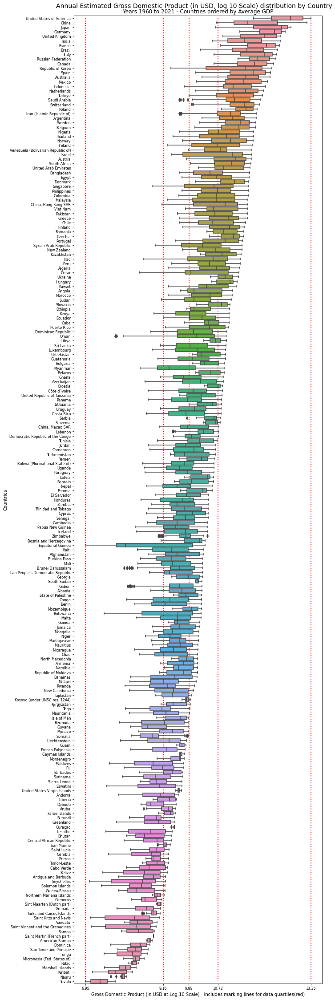

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,40))
ax= sns.boxplot(x='GDP_log_10', y='Country',data=df_demos_GDP, orient="h", order=my_order)
plt.ylabel("Countries")
plt.xlabel("Gross Domestic Product (in USD at Log 10 Scale) - includes marking lines for data quartiles(red)")
ax.set_yticks(countries_ticks)
ax.set_yticklabels(countries_label, fontsize=8)
ax.vlines(quantiles, 0, 212, color='r', ls=':', lw=2, zorder=0 )
ax.set_xticks(quantiles_labels)
ax.set_xticklabels(quantiles_labels, fontsize=8)
plt.suptitle('Annual Estimated Gross Domestic Product (in USD, log 10 Scale) distribution by Country',fontsize=14,y=.89,horizontalalignment='center')
plt.title('Years 1960 to 2021 - Countries ordered by Average GDP',fontsize=12,horizontalalignment='center')
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_COUNTRY_BOX.png', dpi=100)
plt.clf()


Now we can draw some conclusions for Annual GDP distribution using boxplots. Remember that boxplots are there to visualize data in quartiles, where boxes show where 25% to 75% of data is spread, including a line representing 50%. We see outside each box where outliers are. For the 213 countries we managed to get data we see that for the period 1960 to 2021,annual GDP is between 9.16e10 at 25% quartile and 10.73e10 75% quartile with a 50% quartile at 9.89e10. This is telling us that GDP is largely being pulled from top 25% countries. Some of those such as China, Brasil, Indonesia, Russia, and Saudi Arabia have larger pull to higher GDP as their difference between 50% and 75% is bigger.

Now let's look at how GDP and Life Expectency are associated. Here we are not assuming casuality, we are just see how they relate. First we will see how they have evolved trought that 1960 and 2021 period. So we will aggregated data. For GDP we will sum figures, and for life expectency we will aggregate using mean.

In [ ]:
#first let's review of DataFrame using info() function, to refresh what we have.
print(df_demos_GDP.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10326 entries, 0 to 10325
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location code  10326 non-null  int64  
 1   SDMX code**    10326 non-null  int64  
 2   Country Code   10326 non-null  string 
 3   Country        10326 non-null  string 
 4   Parent code    10326 non-null  int64  
 5   Year           10326 non-null  int64  
 6   LEAB           10326 non-null  float64
 7   Population     10326 non-null  float64
 8   APGR           10326 non-null  float64
 9   GDP            10326 non-null  float64
 10  GDP_log_10     10326 non-null  float64
dtypes: float64(5), int64(4), string(2)
memory usage: 1.2 MB
None


In [ ]:
#Now let's visualize our time series using lmplot() functions to plot data and regression model 
#first we aggregate Life Expectancy using the mean function, on Year
GDP_byyear = df_demos_GDP.groupby('Year').mean().LEAB.reset_index()

<Figure size 7200x7200 with 0 Axes>

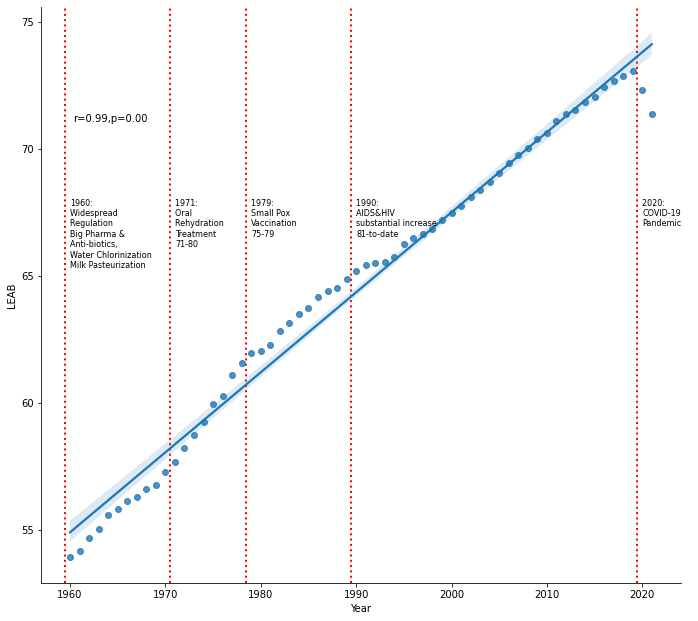

<Figure size 432x288 with 0 Axes>

In [ ]:
#then we define the graph figure to spread the years
plt.figure(figsize=(100,100))
ax = sns.lmplot(x='Year',y='LEAB',data=GDP_byyear, height=10, aspect=1)
# health events:
health_ticks = [1960, 1971,1979,1990,2020]
health_labels = ["1960:\nWidespread \nRegulation \nBig Pharma &\nAnti-biotics, \nWater Chlorinization \nMilk Pasteurization", "1971: \nOral \nRehydration \nTreatment \n71-80","1979: \nSmall Pox \nVaccination\n75-79","1990: \nAIDS&HIV \nsubstantial increase \n81-to-date","2020: \nCOVID-19\nPandemic"]
i =0
top = -5+ GDP_byyear['LEAB'].max()
for tick in health_ticks:
  plt.axvline(tick-.5, 0, 212, color='r', ls=':', lw=2, zorder=0)
  plt.text(tick,top, health_labels[i], va='top',fontsize=8)
  i=i+1

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Year'], data['LEAB'])
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.2f},p={:.2f}'.format(r,p),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
ax.map_dataframe(annotate)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
ax.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_YEAR_MEAN.png', dpi=100)
plt.clf()

[9.0205, 10.5896]


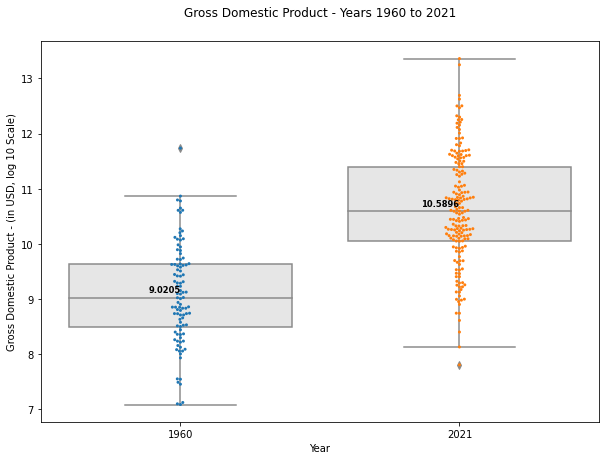

<Figure size 432x288 with 0 Axes>

In [ ]:
df_1950_2021_GDP = df_demos_GDP.loc[(df_demos_GDP['Year'] == 1960)|(df_demos_GDP['Year'] == 2021)].sort_values(by=['GDP_log_10','Country'],ascending=False)
df_1950_2021_GDP['GDP_log_10'] = df_1950_2021_GDP[['GDP_log_10']].dropna()
fig = plt.figure(figsize =(10, 7))
bp =sns.boxplot(x='Year', y='GDP_log_10', data=df_1950_2021_GDP,meanline=True, color=".9")
sns.swarmplot(data=df_1950_2021_GDP, x="Year", y="GDP_log_10", size=3)
medians = list(df_1950_2021_GDP.groupby(['Year'])['GDP_log_10'].median())
medians = [np.round(x,4) for x in medians]
print(medians)
vertical_offset = df_1950_2021_GDP['GDP_log_10'].median()*.01

for xtick in bp.get_xticks():
    bp.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
            horizontalalignment='right',size='small',color='black',weight='semibold')
plt.ylabel('Gross Domestic Product - (in USD, log 10 Scale)')
plt.title ('Gross Domestic Product - Years 1960 to 2021', pad=25)
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_1960_2021.png', dpi=100)
plt.clf()

    Year           GDP
0   1960  1.158137e+12
1   1961  1.205625e+12
2   1962  1.314853e+12
3   1963  1.417411e+12
4   1964  1.551796e+12
..   ...           ...
57  2017  8.049419e+13
58  2018  8.546584e+13
59  2019  8.667317e+13
60  2020  8.382210e+13
61  2021  9.368302e+13

[62 rows x 2 columns]


<Figure size 7200x5760 with 0 Axes>

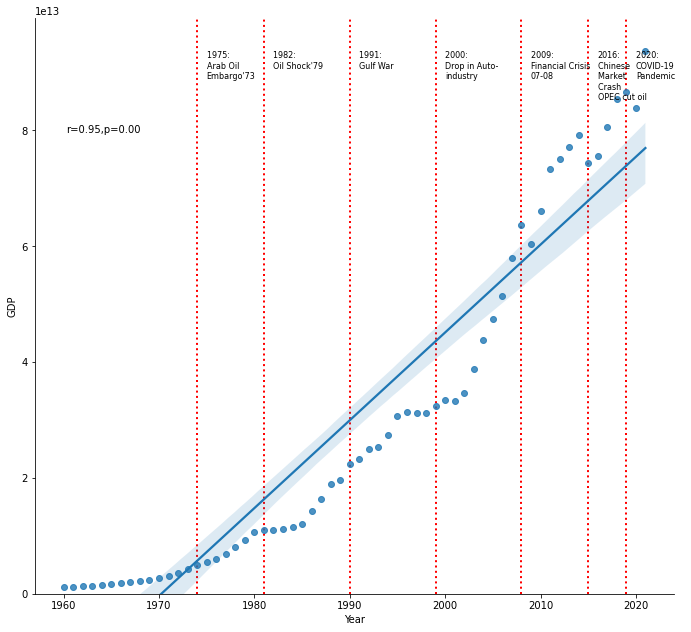

<Figure size 432x288 with 0 Axes>

In [ ]:
#Now let's visualize our time series using lmplot() functions to plot data and regression model 
#first we aggregate GDP using the sum function, on Year
GDP_byyear = df_demos_GDP.groupby('Year').sum().GDP.reset_index()
print(GDP_byyear)
#then we define the graph figure to spread the years
plt.figure(figsize=(100,80))
ax = sns.lmplot(x='Year',y='GDP',data=GDP_byyear, height=10, aspect=1)
ax.set(ylim=(0, None))
# recessions:
recession_ticks = [1975,1982,1991,2000,2009,2016,2020]
recession_labels = ["1975: \nArab Oil \nEmbargo'73","1982: \nOil Shock'79","1991: \nGulf War","2000: \nDrop in Auto- \nindustry","2009: \nFinancial Crisis\n07-08","2016:\nChinese \nMarket \nCrash \nOPEC cut oil","2020: \nCOVID-19\nPandemic"]
i =0
top = -5 + GDP_byyear['GDP'].max()
for tick in recession_ticks:
  plt.axvline(tick-1, 0, 212, color='r', ls=':', lw=2, zorder=0)
  plt.text(tick,top, recession_labels[i], va='top',fontsize=8)
  i=i+1

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Year'], data['GDP'])
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.2f},p={:.2f}'.format(r,p),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
ax.map_dataframe(annotate)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
ax.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_YEAR_SUM.png', dpi=100)
plt.clf()

Is there a correlation between GDP and life expectancy of a country? To answer this question we will visualize correlation between GDP and Life Expectancy at aggregated level plotting them against each other. Next then we will correlation explore at country level. Finally visualize each country by each variable in a line plot against years. This is a drill-down approach, and selected because as you already have the intuition flow of innovation globally both in production and health take more time than crisis impacts. Each country depending on its context and events is expected to have overall better health and wealth through 1960 to 2021 period but for sure different variable behaviours. 

In [ ]:
#Let's recall aggregated data for both GDP and Life Expectancy
GDP_byyear = df_demos_GDP.groupby('Year').sum().GDP.reset_index() # aggregate GDP using sum()
LEAB_byyear = df_demos_GDP.groupby('Year').mean().LEAB.reset_index() #aggregate Life Expectancy by mean()
df_demos_GDP_agg = pd.merge(GDP_byyear, LEAB_byyear, on=["Year"]) # we get 62 years of World GDP and Life Expectacy Data

<Figure size 7200x5760 with 0 Axes>

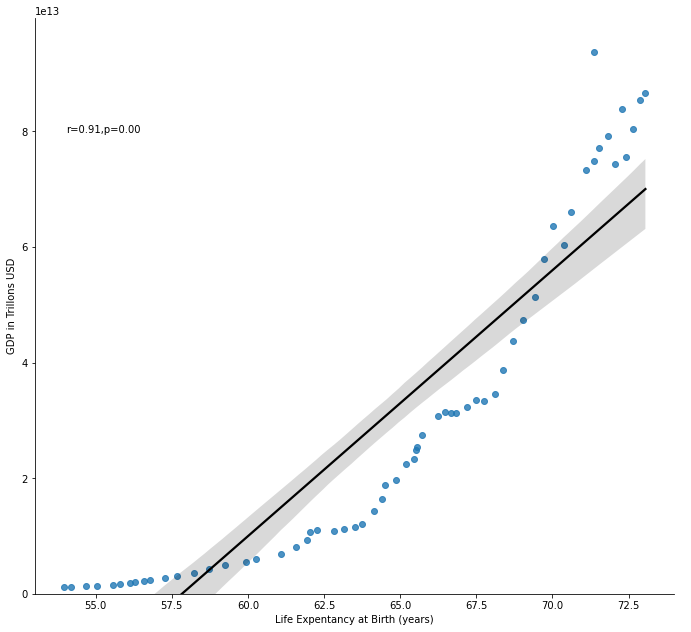

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
# Now let's plot and see if these variables are associated. We will use lmplot() function 
# as we have seen on previous aggregated plotting both show linear positive increase through time
plt.figure(figsize=(100,80))
graph = sns.lmplot(x='LEAB',y='GDP', data=df_demos_GDP_agg, line_kws={'color':'black'},height=10, aspect=1)
graph = graph.set_axis_labels("Life Expentancy at Birth (years)", "GDP in Trillons USD")
graph.set(ylim=(0, None))

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['LEAB'], data['GDP'])
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.2f},p={:.2f}'.format(r,p),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
graph.map_dataframe(annotate)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
graph.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_LEAB_AGG_LINEAR.png', dpi=100)
plt.show()
plt.clf()

From plotting data we see a positive association for GDP and Life Expectancy, at 0.91 correlation but a pearson value of zero. Now let's try with plynominal regression plotting using order=2, see what we get.

In [ ]:
# as magnitud of both GDP and Life Expectancy are serveral degrees of, to shorten
# quantities at visuals we implemented this function to re-write trillions, billions 
# and millions 

import math
def scale_float(number):
    if number < 0.0:
      sign_number = -1
      number = np.abs(number)
    sign_number = +1
    digits = 1 + math.floor(math.log10(number))
    if digits > 12:
        return f"{round((number*sign_number) / 10**12, 3):,.3f} *1e12".replace(".000", "")
    elif digits > 9:
        return f"{round((number*sign_number) / 10**9, 2):,.2f} *1e9".replace(".00", "")
    elif digits > 6:
        return f"{round((number*sign_number) / 10**6, 1):,.1f} *1e6".replace(".0", "")
    elif digits > 0:
        return f"{round((number*sign_number), 2):,.2f}".replace(".00","")
    else:
        return f"{round((number*sign_number) * 100):,} cents".replace("1 cents", "1 cent")

<Figure size 7200x3600 with 0 Axes>

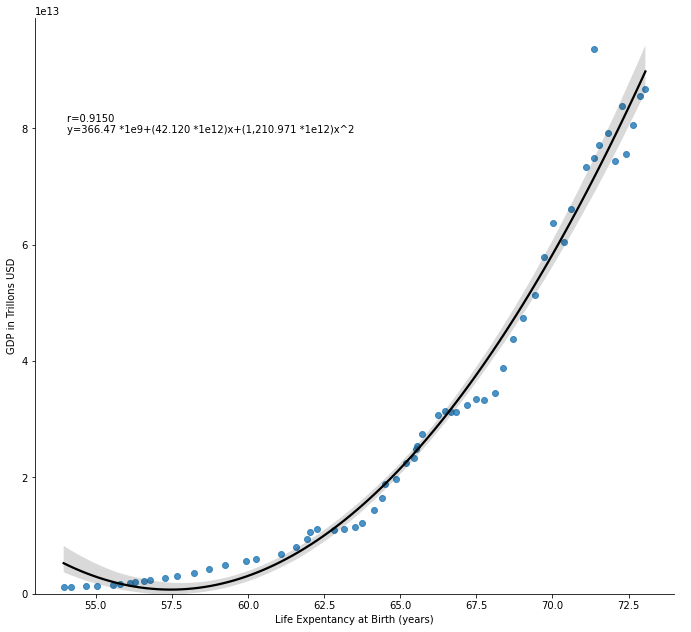

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(100,50))
graph = sns.lmplot(x='LEAB',y='GDP', data=df_demos_GDP_agg, order=2,line_kws={'color': 'black'},height=10, aspect=1)
graph = graph.set_axis_labels("Life Expentancy at Birth (years)", "GDP in Trillons USD")
graph.set(ylim=(0, None))

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['LEAB'], data['GDP'])
    degree = 2 # same as order value at sns.lmplot
    i,x,x2 = np.polyfit(data['LEAB'], data['GDP'],degree) # results aligned with polyfit degree
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.4f} \ny={}+({})x+({})x^2'.format(r, scale_float(i),scale_float(x),scale_float(x2)),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
graph.map_dataframe(annotate)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
graph.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_GDP_AGG_ORDER2.png', dpi=100)
plt.clf()


<Figure size 7200x5760 with 0 Axes>

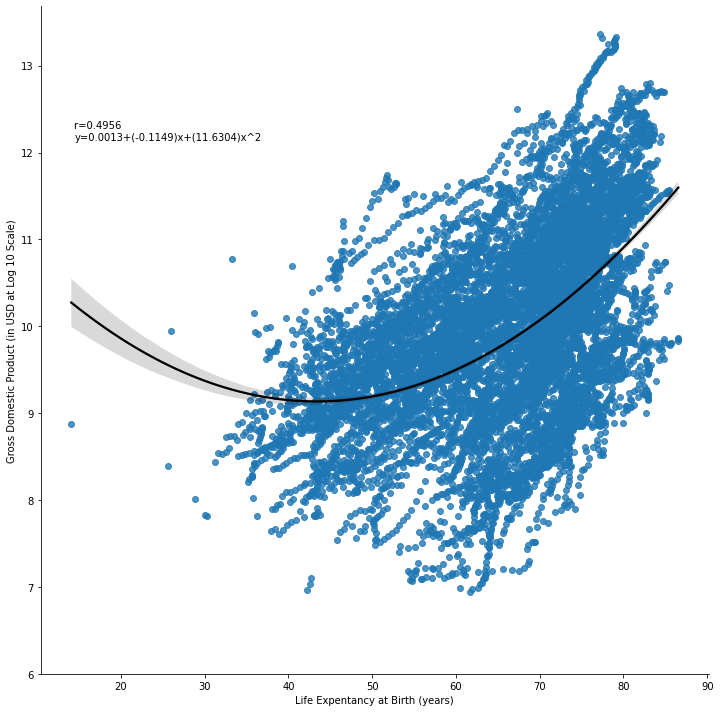

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(100,80))
graph = sns.lmplot(x='LEAB',y='GDP_log_10', data=df_demos_GDP,order=2,line_kws={'color': 'black'},height=10, aspect=1)
graph = graph.set_axis_labels("Life Expentancy at Birth (years)", "Gross Domestic Product (in USD at Log 10 Scale)")
graph.set(ylim=(6, None))

def annotate(data, **kws):
    r,p = sp.stats.pearsonr(data['LEAB'], data['GDP_log_10'])
    degree = 2 # same as order value at sns.lmplot
    i,x,x2 = np.polyfit(data['LEAB'], data['GDP_log_10'],degree) # results aligned with polyfit degree
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.4f} \ny={}+({})x+({})x^2'.format(r,np.round(i,4),np.round(x,4),np.round(x2,4)),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
graph.map_dataframe(annotate)
graph.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_GDP_DETAIL_ORDER2.png', dpi=100)
plt.clf()

<Figure size 7200x5760 with 0 Axes>

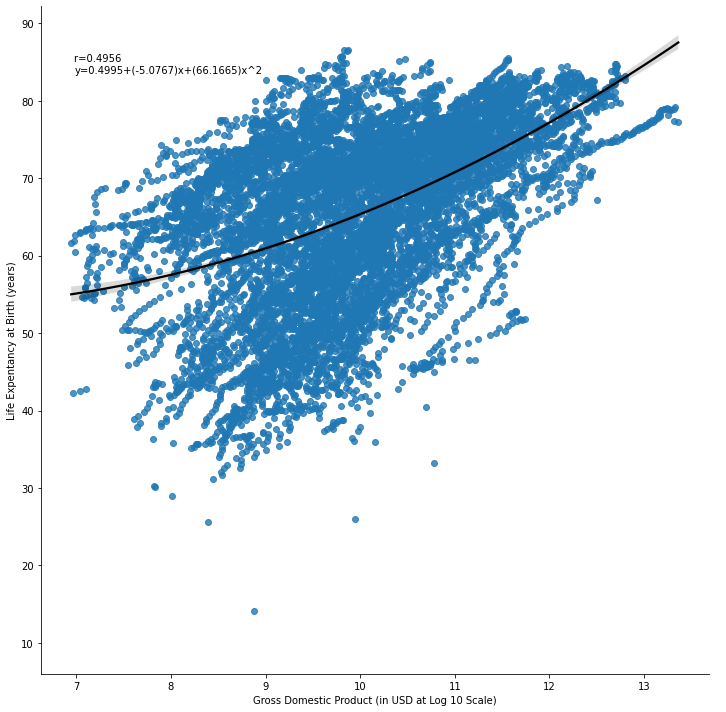

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(100,80))
graph = sns.lmplot(x='GDP_log_10',y='LEAB', data=df_demos_GDP,order=2,line_kws={'color': 'black'},height=10, aspect=1)
graph = graph.set_axis_labels("Gross Domestic Product (in USD at Log 10 Scale)","Life Expentancy at Birth (years)")
graph.set(ylim=(6, None))

def annotate(data, **kws):
    r,p = sp.stats.pearsonr(data['GDP_log_10'],data['LEAB'])
    degree = 2 # same as order value at sns.lmplot
    i,x,x2 = np.polyfit(data['GDP_log_10'], data['LEAB'],degree) # results aligned with polyfit degree
    ax = plt.gca()
    ax.text(.05, .9, 'r={:.4f} \ny={}+({})x+({})x^2'.format(r,np.round(i,4),np.round(x,4),np.round(x2,4)),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5,.5])
    
graph.map_dataframe(annotate)
graph.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_LEAB_DETAIL_ORDER2.png', dpi=100)
plt.clf()

              Year           GDP       LEAB   LEAB_pct    GDP_pct
count    62.000000  6.200000e+01  62.000000  61.000000  61.000000
mean   1990.500000  3.070536e+13  64.507052   0.004602   0.076366
std      18.041619  2.879419e+13   5.725295   0.003972   0.060717
min    1960.000000  1.158137e+12  53.950660  -0.012934  -0.060435
25%    1975.250000  5.676407e+12  60.029280   0.003350   0.032961
50%    1990.500000  2.290556e+13  65.319492   0.004360   0.082757
75%    2005.750000  5.035135e+13  69.333432   0.006175   0.120666
max    2021.000000  9.368302e+13  73.052894   0.013238   0.219708


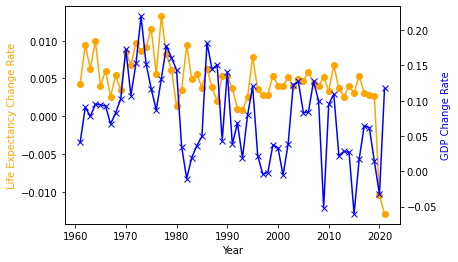

<Figure size 432x288 with 0 Axes>

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests
prep_data = df_demos_GDP.sort_values(by=['Country','Year'])
prep_data['LEAB_pct'] = prep_data[['LEAB']].pct_change().dropna()
prep_data['GDP_pct'] = prep_data[['GDP']].pct_change().dropna()
data = prep_data
quantiles_LEAB = np.quantile(data['LEAB'], np.array([0, 0.25, 0.50, 0.75, 1]))
quantiles_GDP = np.quantile(data['GDP'], np.array([0, 0.25, 0.50, 0.75, 1]))
data.drop(data[(data['LEAB'] <= quantiles_LEAB[1])|(data['LEAB_pct'] >= quantiles_LEAB[3])].index, inplace = True)
data.drop(data[(data['GDP'] <= quantiles_GDP[1])|(data['GDP_pct'] >= quantiles_GDP[3])].index, inplace = True)
df_demos_GDP_agg['LEAB_pct'] = df_demos_GDP_agg[['LEAB']].pct_change().dropna()
df_demos_GDP_agg['GDP_pct'] = df_demos_GDP_agg[['GDP']].pct_change().dropna()
print(df_demos_GDP_agg.describe(include='all'))

fig,ax = plt.subplots()

ax.plot(df_demos_GDP_agg.Year,
        df_demos_GDP_agg.LEAB_pct,
        color="orange", 
        marker="o")
ax.set_xlabel("Year")
ax.set_ylabel("Life Expectancy Change Rate",
              color="orange")
ax2=ax.twinx() 
ax2.plot(df_demos_GDP_agg.Year, df_demos_GDP_agg["GDP_pct"],color="blue",marker="x")
ax2.set_ylabel("GDP Change Rate",color="blue")
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_LEAB_PCT_YEAR.png', dpi=100, bbox_inches ="tight",
            pad_inches = 1,
            transparent = True,)
plt.clf()

In [ ]:
grangercausalitytests(data[['GDP_pct','LEAB_pct']],maxlag=[19]) # p-value is lower that 0.05, Null hypothesis is rejected,
# hence changes in Gross Domestic Product are granger causing changs in to life exptectancy. 


Granger Causality
number of lags (no zero) 19
ssr based F test:         F=1.8794  , p=0.0116  , df_denom=6157, df_num=19
ssr based chi2 test:   chi2=35.9352 , p=0.0108  , df=19
likelihood ratio test: chi2=35.8314 , p=0.0111  , df=19
parameter F test:         F=1.8794  , p=0.0116  , df_denom=6157, df_num=19


{19: ({'ssr_ftest': (1.879421102851302, 0.011633468654436662, 6157.0, 19),
   'ssr_chi2test': (35.9351908254128, 0.010750606228406, 19),
   'lrtest': (35.83138461108683, 0.011070101631160524, 19),
   'params_ftest': (1.8794211028514143, 0.01163346865442605, 6157.0, 19.0)},
   array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
      

In [ ]:
grangercausalitytests(data[['LEAB_pct','GDP_pct']],maxlag=[19]) # p-value is much higher that 0.05, Null hypothesis is NOT REJECTED,
# so changes in life exptectancy are granger causing changs in to Gross Domestic Product.


Granger Causality
number of lags (no zero) 19
ssr based F test:         F=0.3880  , p=0.9919  , df_denom=6157, df_num=19
ssr based chi2 test:   chi2=7.4194  , p=0.9916  , df=19
likelihood ratio test: chi2=7.4149  , p=0.9917  , df=19
parameter F test:         F=0.3880  , p=0.9919  , df_denom=6157, df_num=19


{19: ({'ssr_ftest': (0.3880359500147776, 0.9919062180549757, 6157.0, 19),
   'ssr_chi2test': (7.419383495133942, 0.9916197598288666, 19),
   'lrtest': (7.41494487773889, 0.9916511833749577, 19),
   'params_ftest': (0.38803595001471414, 0.99190621805499, 6157.0, 19.0)},
   array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          

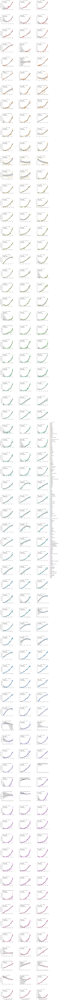

<Figure size 432x288 with 0 Axes>

In [ ]:
# Here we will use again polynominal regression by order of 2.
# As we know already that association is non-linear we will 

graph = sns.lmplot(x='LEAB',y='GDP', col='Country', hue='Country', data=df_demos_GDP, order=2, col_wrap=3, line_kws={'color':'black'},sharey = False, sharex = False)
graph = graph.set_axis_labels("Life Expentancy at Birth (years)", "GDP in Trillons USD")
graph.set(ylim=(0, None))

def annotate(data, **kws):
    degree = 2 # same as order value at sns.lmplot
    i,x,x2 = np.polyfit(data['LEAB'], data['GDP'],degree) # results aligned with polyfit degree
    ax = plt.gca()
    ax.text(.05, .8, 'y={} \n+({})x \n +({})x^2'.format(scale_float(i),scale_float(x),scale_float(x2)),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, -1])
    
graph.map_dataframe(annotate)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
graph.add_legend()
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_LEAB_COUNTRY.png', dpi=100)
plt.clf()

In [ ]:
#Let's have a look at the DataFrames avalable a this point
#we are using var[0]!='_' as this is the case for DataFrames
#copied for internal use only. Using dir() function to get
#all objects in memory. We use also isinstance() to condition 
sheets=[]    
for var in dir():
    if isinstance(locals()[var], pd.core.frame.DataFrame)  and var[0]!='_':
        sheets.append(var)
print(sheets)
print(df_demos_GDP.head())#let's use df_demos_GDP

['GDP_byyear', 'LEAB_byyear', 'data', 'data_GDP', 'data_demos', 'df_1950_2021', 'df_GDP', 'df_demos', 'df_demos_GDP', 'df_demos_GDP_agg', 'prep_data', 'prep_order']
   Location code  SDMX code** Country Code  Country  Parent code  Year  \
0            108          108          BDI  Burundi          910  1960   
1            108          108          BDI  Burundi          910  1961   
2            108          108          BDI  Burundi          910  1962   
3            108          108          BDI  Burundi          910  1963   
4            108          108          BDI  Burundi          910  1964   

     LEAB  Population   APGR          GDP  GDP_log_10  
0  43.024   2746628.0  1.958  195999990.0    8.292256  
1  43.252   2815972.0  3.015  202999992.0    8.307496  
2  43.441   2887398.0  2.007  213500006.0    8.329398  
3  43.718   2948133.0  2.155  232749998.0    8.366890  
4  43.974   3033221.0  3.517  260750008.0    8.416224  


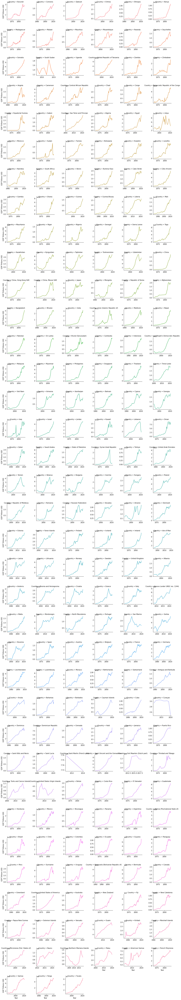

<Figure size 432x288 with 0 Axes>

In [ ]:
# Here we will use again polynominal regression by order of 2.
# As we know already that association is non-linear we will 

graphGDP = sns.FacetGrid(df_demos_GDP, col="Country", col_wrap=6,
                      hue = "Country", sharey = False, sharex=False)

graphGDP = (graphGDP.map(sns.lineplot,"Year","GDP")
         .set_axis_labels("Year","GDP Trillions USD"))

graphGDP;
graph.set(ylim=(0, None))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('GDP_YEAR_COUNTRY.png', dpi=100)
plt.clf()

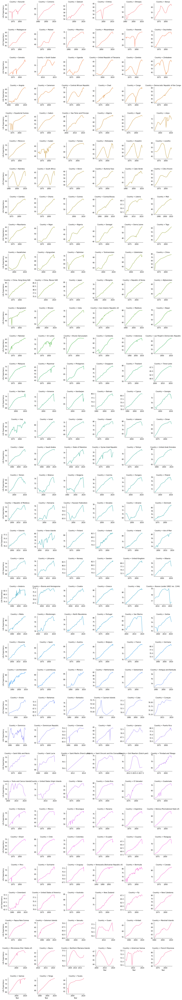

<Figure size 432x288 with 0 Axes>

In [ ]:
# Here we will use again polynominal regression by order of 2.
# As we know already that association is non-linear we will 

graphGDP = sns.FacetGrid(df_demos_GDP, col="Country", col_wrap=6,
                      hue = "Country", sharey = False, sharex=False)

graphGDP = (graphGDP.map(sns.lineplot,"Year","LEAB")
         .set_axis_labels("Year","Life Expectancy"))

graphGDP;
graph.set(ylim=(0, None))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=.9, 
                    wspace=0.6, 
                    hspace=0.7)
fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LEAB_YEAR_COUNTRY.png', dpi=100)
plt.clf()

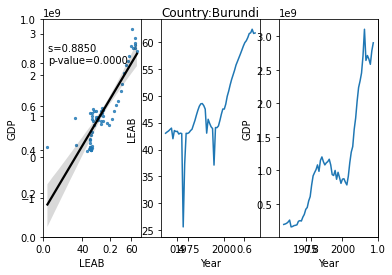

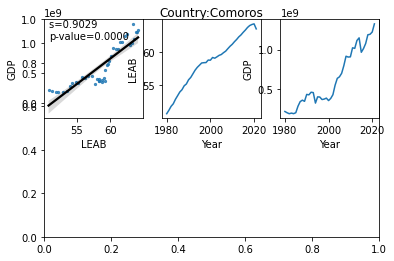

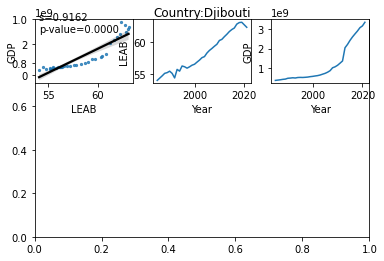

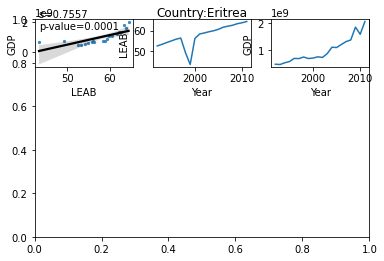

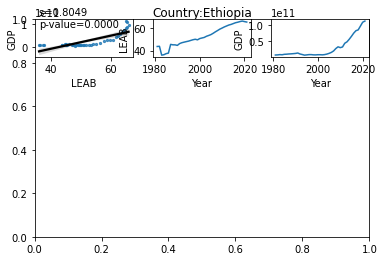

...

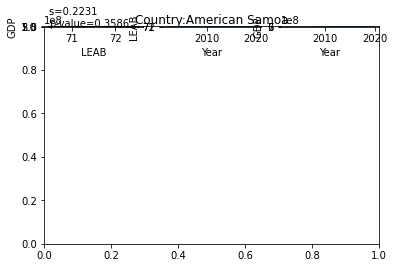

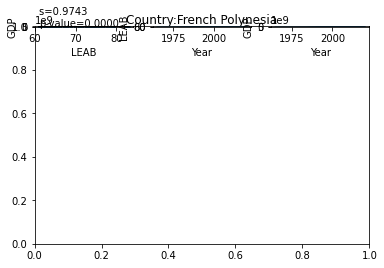

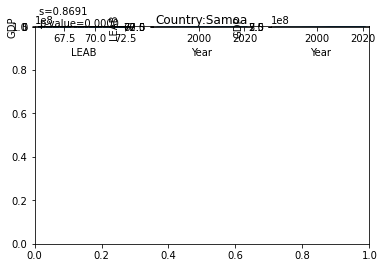

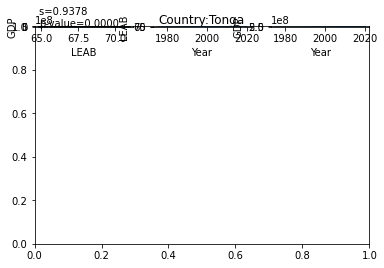

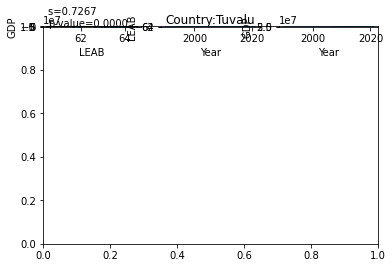

<Figure size 432x288 with 0 Axes>

In [ ]:
def annotate(data, **kws):
    r,p = sp.stats.pearsonr(data['LEAB'], data['GDP'])
    ax = plt.gca()
    ax.text(.05, .8, 's={:.4f} \np-value={:.4f}'.format(r,p),
            transform=ax.transAxes)
    ttl = ax.title
    ttl.set_position([.5, .5])
    
rows = df_demos_GDP['Country'].nunique()
country= df_demos_GDP['Country'].unique()

for r in range(rows):
  fig = plt.figure()
  value= country[r]
  data_country = df_demos_GDP.loc[df_demos_GDP['Country'] == value]
  plt.title("Country:"+ value,horizontalalignment='center', verticalalignment='center')
  for i in range(1, 4):
    ax = fig.add_subplot(r+1,3,i)
    if(i == 1):
      sns.regplot(x = 'LEAB', y = 'GDP',data = data_country,scatter_kws={"s":5},line_kws={'color':'black'})
      annotate(data_country)
    elif(i == 2):
      sns.lineplot(x = 'Year', y = 'LEAB',data = data_country)
    elif(i == 3):
      sns.lineplot(x = 'Year', y = 'GDP',data = data_country)

fig1 = plt.gcf()
plt.show()
plt.draw()
fig1.savefig('LMPLOT_LEABLINE_GDPLINE_COUNTRY.png', dpi=100)
plt.clf()